<b><u>Exercises:<u></b><br>
<b>E01:</b> train a trigram language model, i.e. take two characters as an input to predict the 3rd one. Feel free to use either counting or a neural net. Evaluate the loss; Did it improve over a bigram model?<br>
<b>Results:</b> Yes. The trigram model implemeted using counting as well as nueral net both had lower loss compared to the bigram approach.

<b>E02:</b> split up the dataset randomly into 80% train set, 10% dev set, 10% test set. Train the bigram and trigram models only on the training set. Evaluate them on dev and test splits. What can you see?<br>
<b>Results:</b> <ul><li>The counting models (both bigram and trigram) had lower loss compared to neural net models (bigram and trigram) as we are using the exact frequencies to compute the probablity matrix in the case of counting models but the neural net has to learn (training) to compute the probablity matrix since it is an approximation it has slightly higher loss compared to the counting models</li><li>Trigram models (both counting and neural net) had lower loss compared to the bigram models (both counting and neural net) as we had the context of the previous two characters instead of just one character. Also the names generated by the trigram models are better and slightly meaningful compared to the bigram models</li><li>All the models (bigram counting & neural net and trigram counting & neural net) when trained on training set and then evaluated on the train, dev and test set showed a similar pattern where the all the losses among train, dev and test were very close which indicates that models were not overfitting (i.e memorizing the data rather than generalization) also the order of loss (post-training) tigram counting model < trigram neural net model < bigram counting model < bigram neural net</li><li>The reason why when we are doing evaluation (this is mainly for the neural net model evaluation), when the model is evaluated on the training set its loss is less compared to post taining loss is that while training we have a regulariztion loss component in the total loss (i.e 0.01*(W**2).mean() where we can modify the 0.01 consatnt to smooth the model if the constant is less the model is peaked if it is high then the model is smoother it generalizes more also if the value is high then the regularization part of the loss will play more role in the overall loss) so while doing evaluation we do not consider this hence the loss is slighly lower. The reason why we have regulaization loss component is to prevent the model from overfitting and it helps in generalization basically it penalizes the larger weights but we must be careful because we don't a skewed model (overfitting) or too general of a model (underfitting), if its too skewed its like memorizing and if its too general then it has not learned complex patterns so it won't be able to make better prediction, so for e.g if we have a too skewed a model then the model will spew out the things similar to the training data and if its too general then it spew out meaningless things as its too general, so somewhere between this spectrum is the sweet spot where the model is good at generalizing as well as creating new and specific names</li></ul> 

<b>E03</b>: use the dev set to tune the strength of smoothing (or regularization) for the trigram model - i.e. try many possibilities and see which one works best based on the dev set loss. What patterns can you see in the train and dev set loss as you tune this strength? Take the best setting of the smoothing and evaluate on the test set once and at the end. How good of a loss do you achieve?<br>
<b>Results:</b><ul><li>For trigram counting model as I increased k (smoothing constant/laplace smoothing parameter) the loss increased as it starts to underfit the training data, I got the best dev set loss for k = 0.1 and the loss was 2.1032919883728027. I then evaluated the test set with the probablity matrix which was smoothed with k = 0.1 and got a slightly lower test loss compared to the previous exercise where we only split the dataset (80% train, 10% dev and 10% test)</li><li>For the trigram neural net model as I increased the regularization coefficient (or lambda) the loss started to increase due to underfiting i.e the model has generalized to the point that it is not learning anything and not able to create meaningful names, I got the best dev set loss for lambda = 0.0001 and the loss was 2.2389163970947266. I then evaluated the test set with model which was trained with trained with this lambda = 0.0001 and got a similar test set loss to the previous exercise</li></ul>

<b>E04</b>: we saw that our 1-hot vectors merely select a row of W, so producing these vectors explicitly feels wasteful. Can you delete our use of F.one_hot in favor of simply indexing into rows of W?<br>
<b>Results:</b> Implemented this optimization for the bigram neural net model by replacing the one-hot encoding and matrix multiplication with direct indexing into the weights matrix  W . Specifically, the line logits = W[xs] was added in both the training and sampling blocks. Here,  W  is the weights matrix, and xs is a list of input character indices (with values between 0 and 26). This approach directly retrieves the logits for each input character index, effectively achieving the same result as creating one-hot encoding vectors for the indices and multiplying them by the weights matrix. By removing the unnecessary overhead of one-hot encoding, we make the implementation more efficient without changing the model’s functionality.

<b>E05</b>: look up and use F.cross_entropy instead. You should achieve the same result. Can you think of why we'd prefer to use F.cross_entropy instead?<br>
<b>Results:</b> Yes got the same result while using F.cross_entropy function. It made the code simpler and the function in a single line handles both applying softmax and computing the NLL and gives the loss, it also helps in numerical stability (it handles large as well as small logits gracefully) and it is an optimized function (optimized both in terms of memory usage and computation speed).

<b>E06</b>: meta-exercise! Think of a fun/interesting exercise and complete it.<br>
<b>Results:</b> Pending (will do in the future)

In [1]:
# E01
words = open('names.txt', 'r').read().splitlines()

In [802]:
len(words)

32033

In [2]:
t = {}

for w in words:
    chrs = ['<S>'] + list(w) + ['<E>']
    for ch1, ch2, ch3 in zip(chrs, chrs[1:], chrs[2:]):
        trigram = (ch1+ch2, ch3)
        t[trigram] = t.get(trigram, 0) + 1

In [3]:
import torch

In [4]:
N = torch.zeros((27, 27, 27), dtype=torch.int32)

In [5]:
chars = sorted(list(set(''.join(words))))
stoi = {s:i + 1 for i, s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s, i in stoi.items()}

In [6]:
for w in words:
    chrs = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chrs, chrs[1:], chrs[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        N[ix1, ix2, ix3] += 1

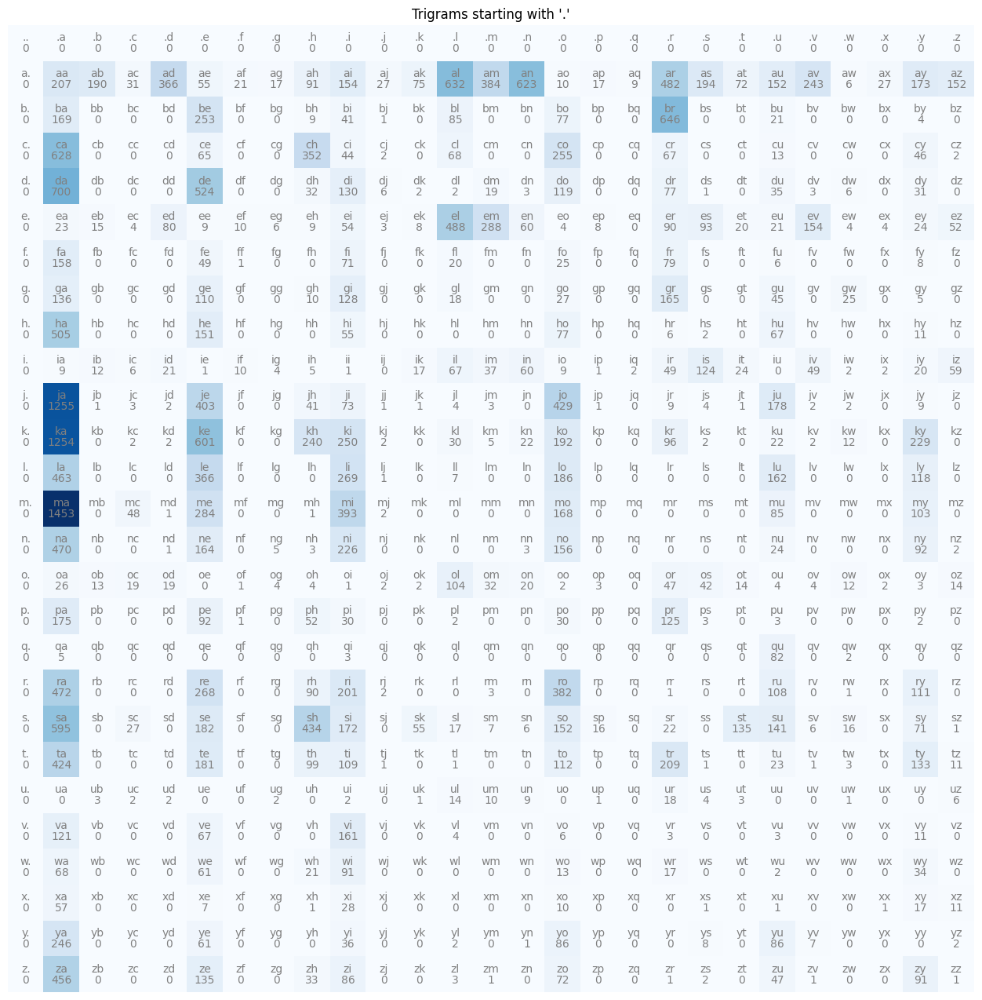

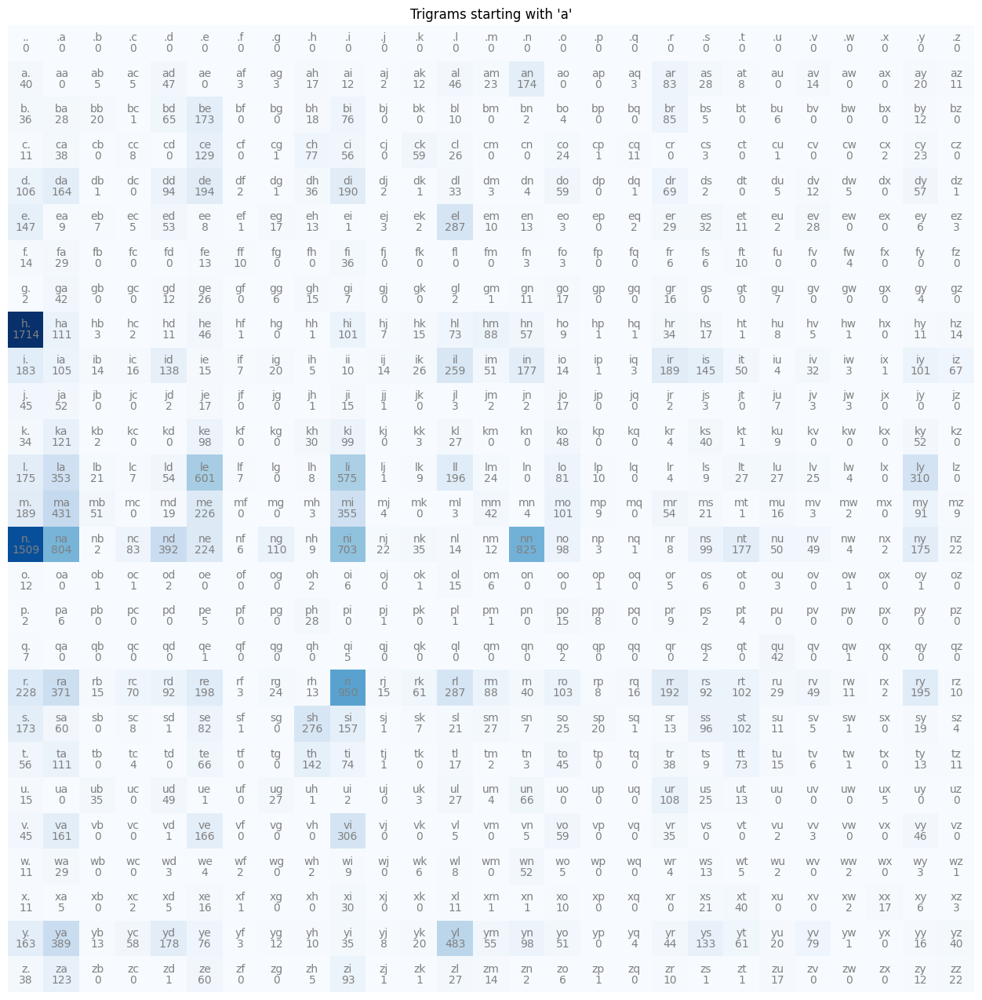

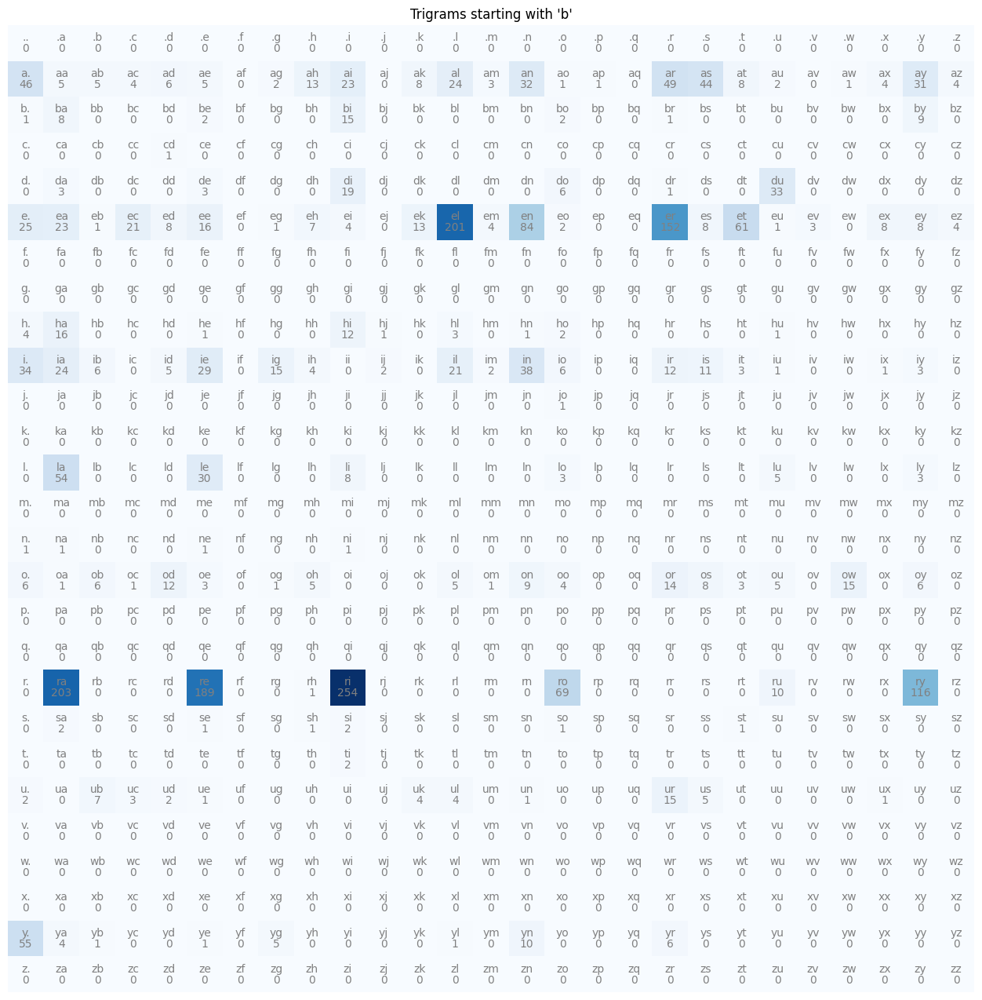

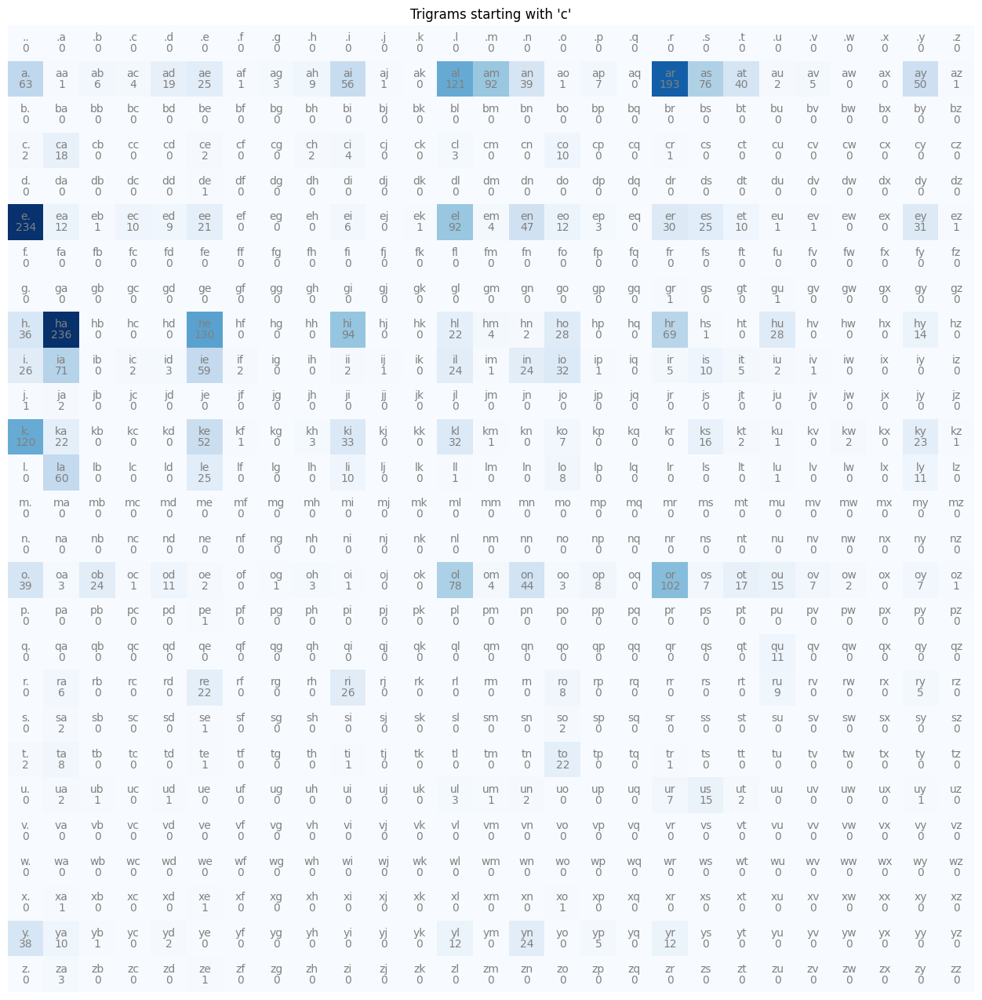

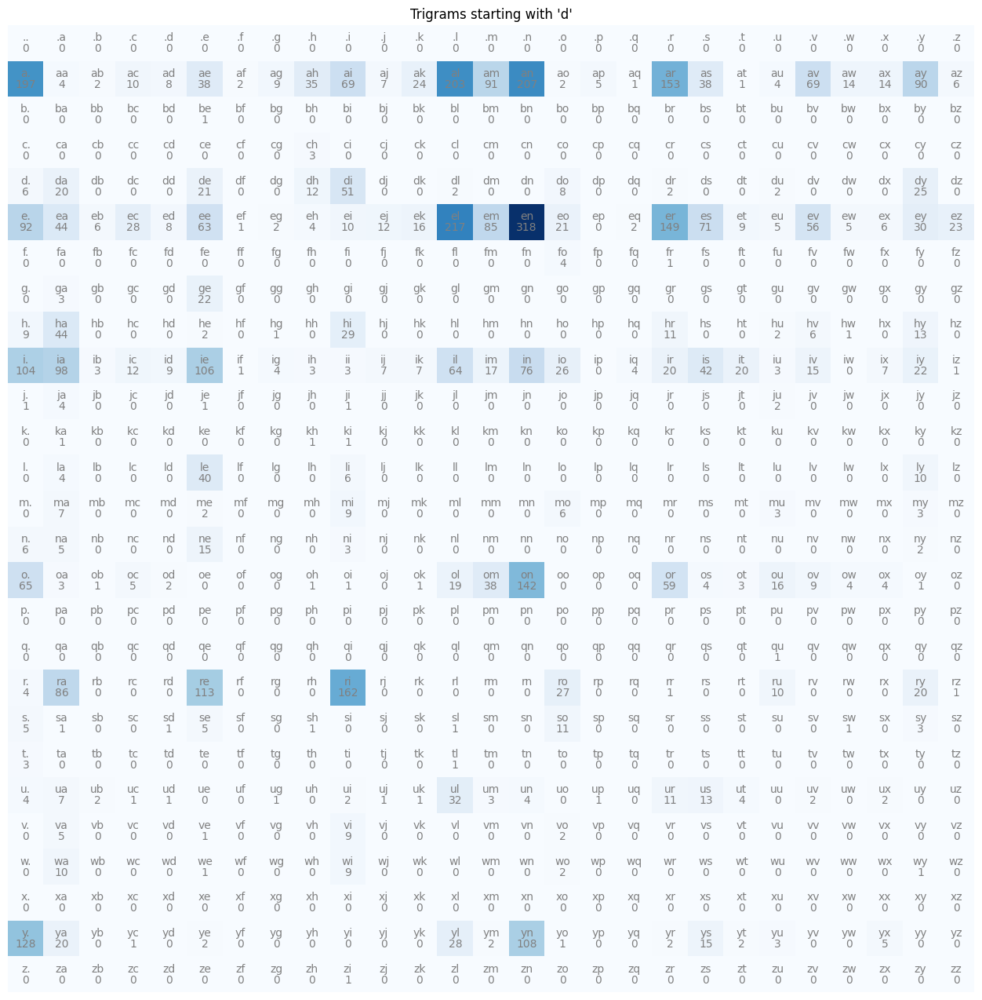

...

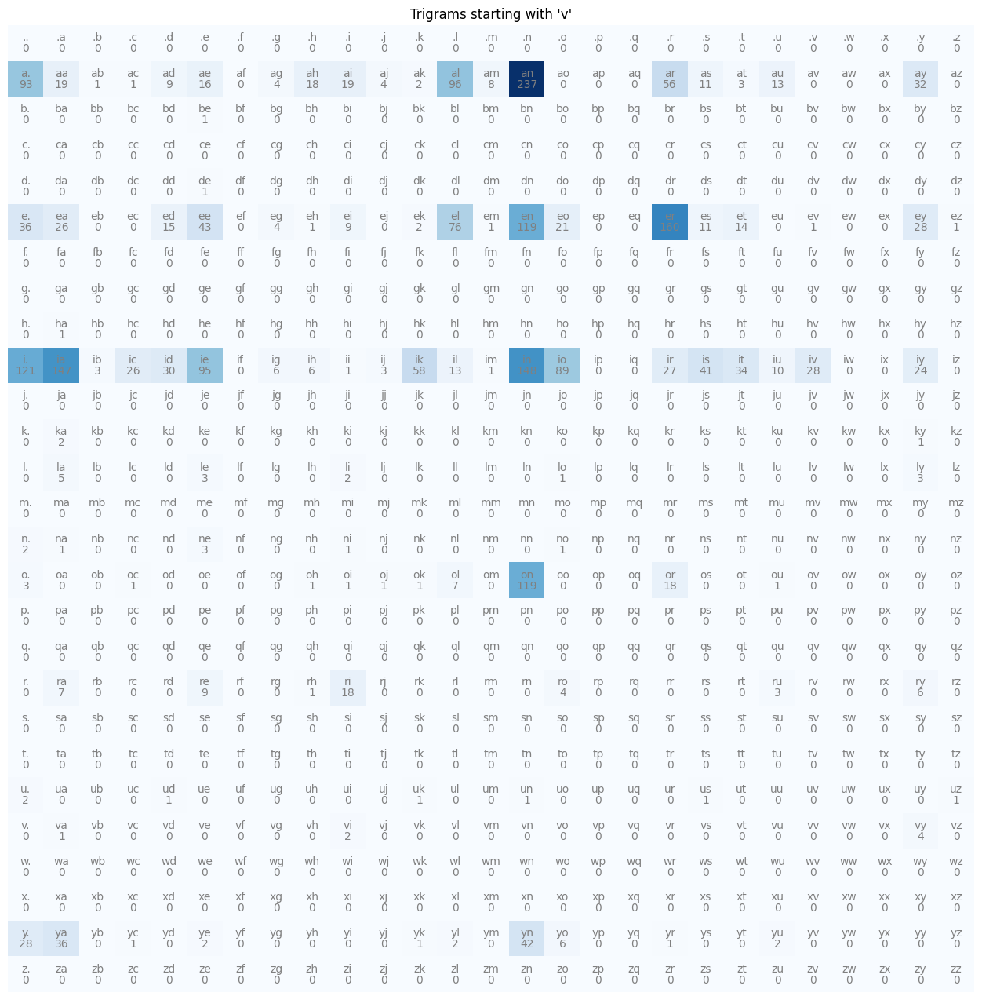

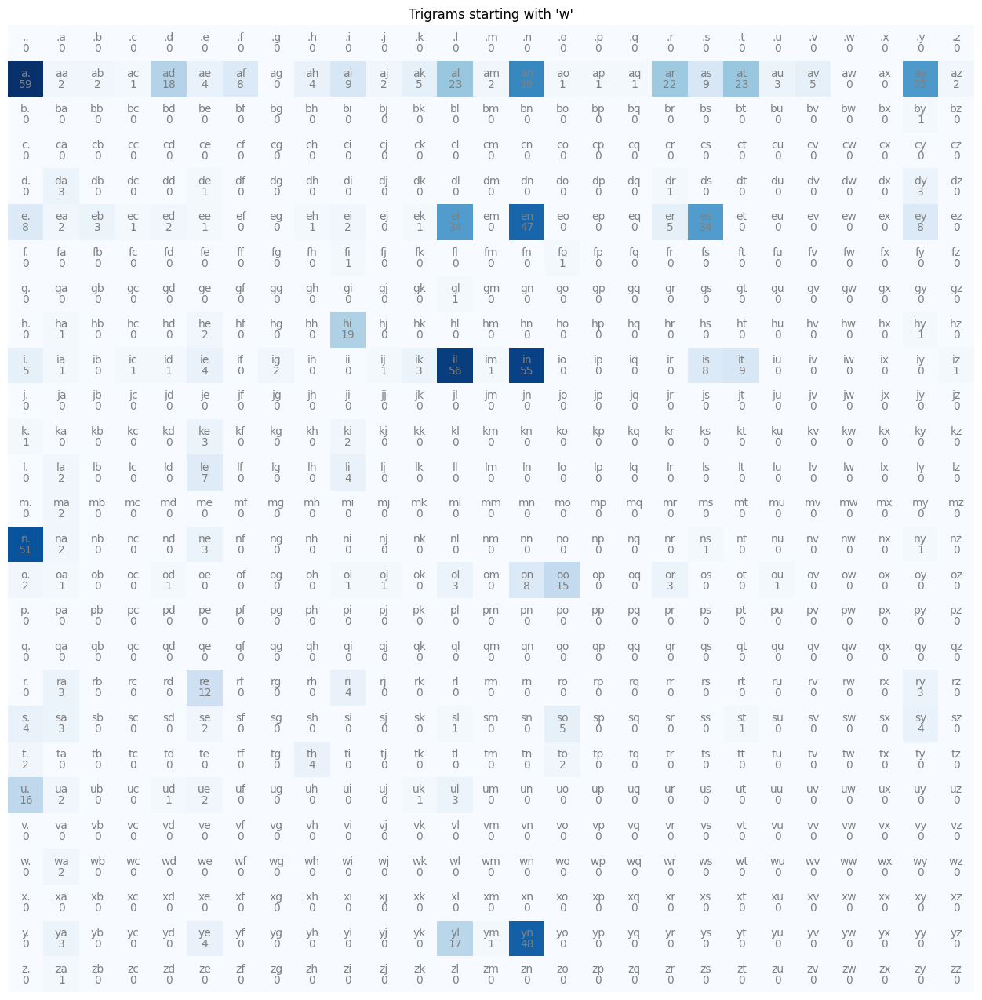

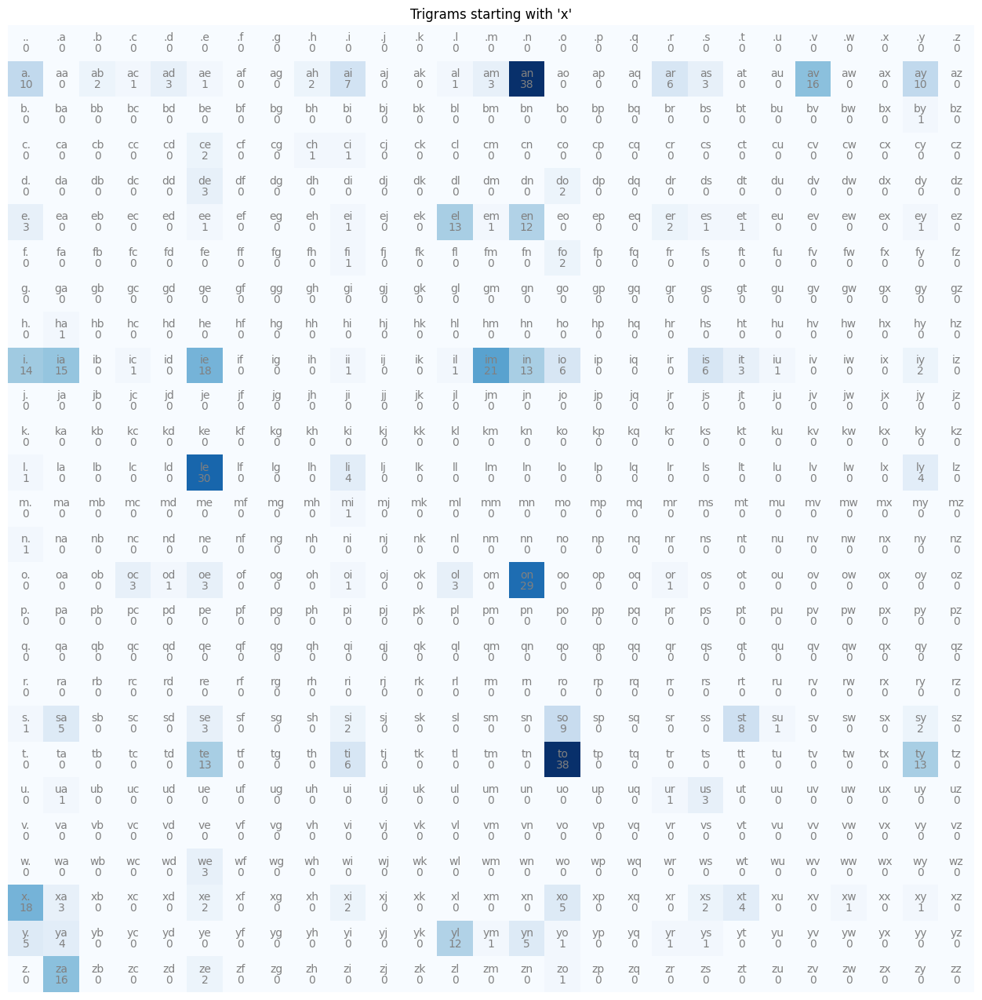

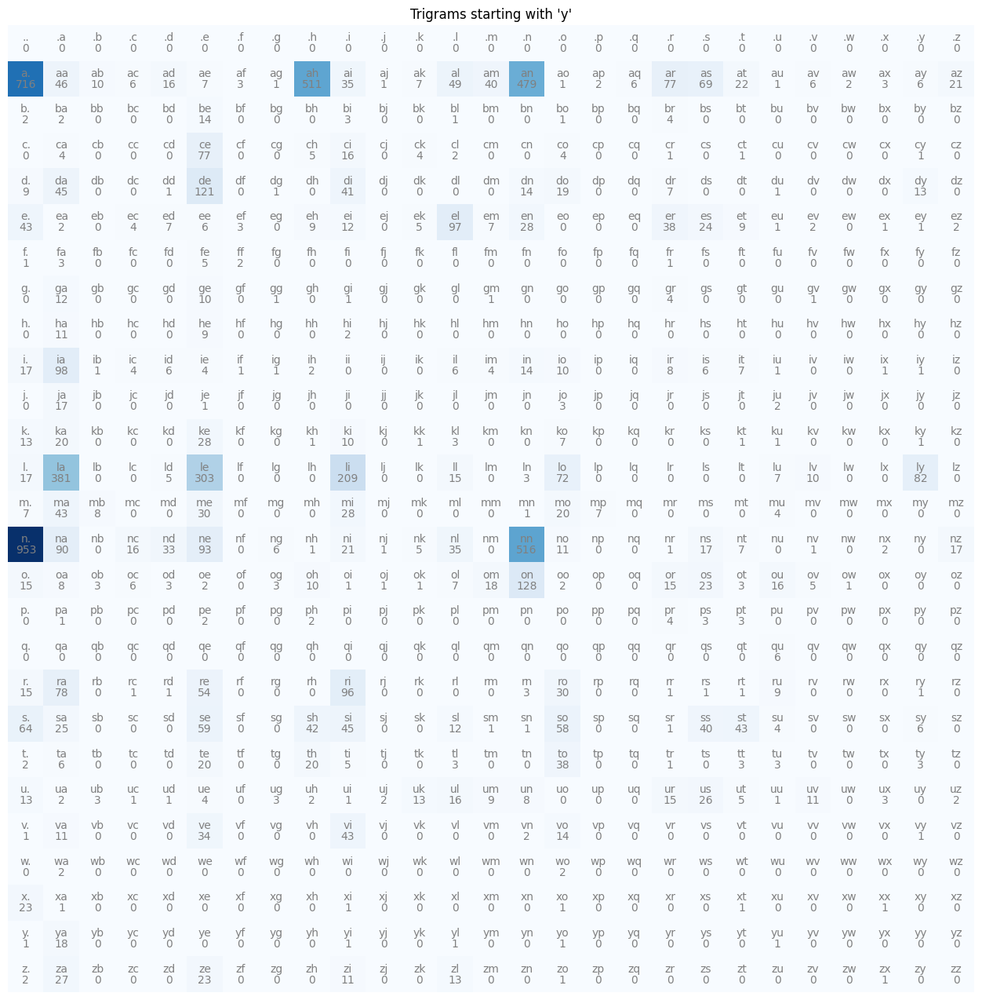

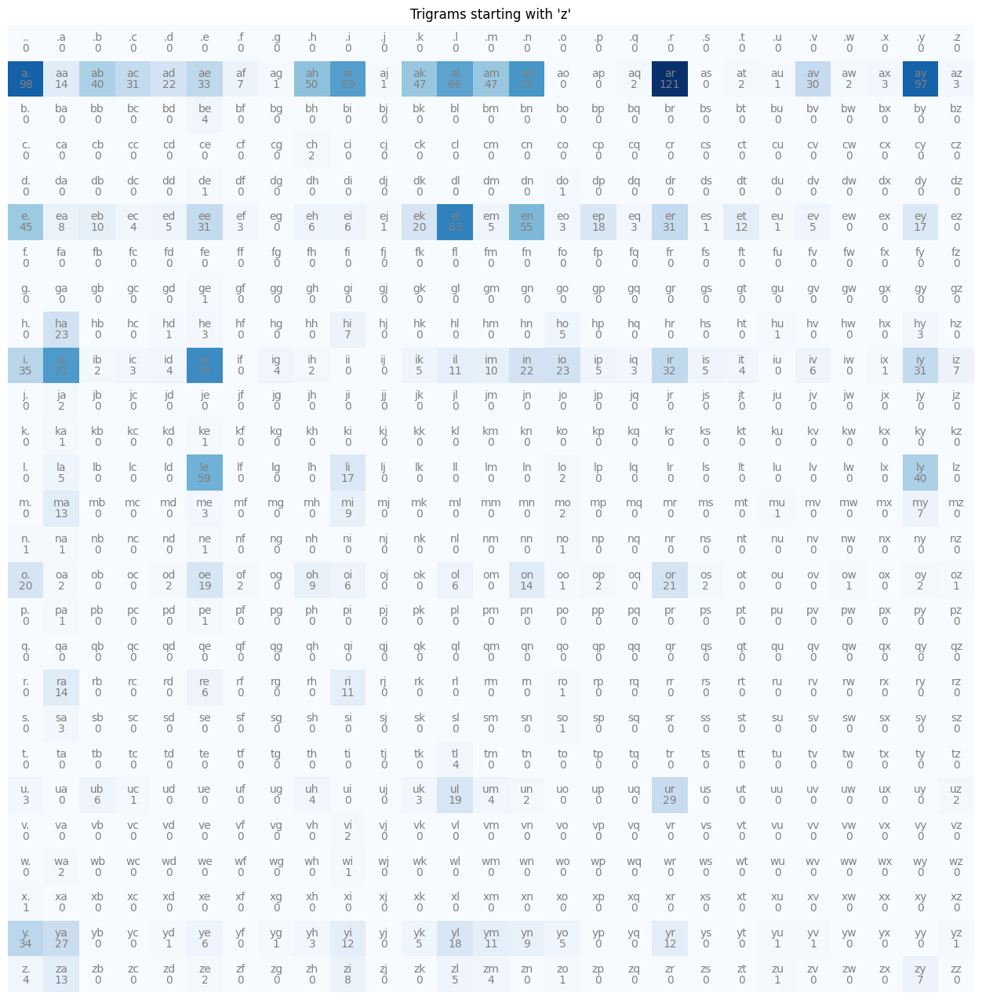

In [7]:
import matplotlib.pyplot as plt

for slice_ix in range(27):  # Iterate over all possible starting characters
    slice_data = N[slice_ix]  # Extract the 27x27 slice for the character

    plt.figure(figsize=(16, 16))
    plt.imshow(slice_data, cmap='Blues')
    for i in range(27):
        for j in range(27):
            chrstr = itos[i] + itos[j]
            plt.text(j, i, chrstr, ha="center", va="bottom", color='Gray')
            plt.text(j, i, slice_data[i, j].item(), ha="center", va="top", color='Gray')
    plt.title(f"Trigrams starting with '{itos[slice_ix]}'")
    plt.axis('off')
    plt.show()

In [8]:
N[0][1]

tensor([  0, 207, 190,  31, 366,  55,  21,  17,  91, 154,  27,  75, 632, 384,
        623,  10,  17,   9, 482, 194,  72, 152, 243,   6,  27, 173, 152],
       dtype=torch.int32)

In [35]:
P = (N + 1).float()
P /= P.sum(dim=2, keepdims=True)

In [801]:
g = torch.Generator().manual_seed(378291)

for _ in range(10):
    out = []
    ix1 = 0
    ix2 = 0
    while True:
        p = P[ix1, ix2]
        # p = torch.tensor([1/27.0 for _ in range(27)])
        ix3 = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix3])
        ix1 = ix2
        ix2 = ix3
        if ix3 == 0:
            break
    print(''.join(out))

dashlotorri.
sin.
ivio.
inon.
anny.
quezmer.
kel.
zacyjatharian.
tymil.
goritt.


In [119]:
log_likelihood = 0.0
n = 0

for w in words:
    chars = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chars, chars[1:], chars[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        prob = P[ix1, ix2, ix3]
        logprob = torch.log(prob)
        log_likelihood += logprob
        n += 1

print(f'{log_likelihood=}')
nll = -log_likelihood
print(f'{nll=}')
print(f'{nll/n}')

log_likelihood=tensor(-410414.9688)
nll=tensor(410414.9688)
2.092747449874878


In [195]:
# creating training set for trigrams
xs1 = []
xs2 = []
ys = []

for w in words[:1]:
    chars = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chars, chars[1:], chars[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        xs1.append(ix1)
        xs2.append(ix2)
        ys.append(ix3)
        # print(f'{chr1} {chr2} {chr3}')

xs1 = torch.tensor(xs1)
xs2 = torch.tensor(xs2)
ys = torch.tensor(ys)

In [196]:
import torch.nn.functional as F

In [198]:
xs1_enc = F.one_hot(xs1, num_classes=27).float()
xs2_enc = F.one_hot(xs2, num_classes=27).float()
xenc = torch.cat((xs1_enc, xs2_enc), dim=1)
xenc

tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [199]:
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((54, 27), generator=g)

In [200]:
logits = xenc @ W
counts = logits.exp()
probs = counts / counts.sum(dim=1, keepdims=True)
probs

tensor([[0.0237, 0.0177, 0.0107, 0.0049, 0.0223, 0.0096, 0.0111, 0.0090, 0.0071,
         0.0424, 0.0704, 0.0511, 0.0196, 0.0240, 0.2683, 0.0824, 0.0320, 0.0058,
         0.1061, 0.0203, 0.0267, 0.0060, 0.0026, 0.0565, 0.0026, 0.0264, 0.0407],
        [0.0224, 0.0482, 0.0110, 0.0675, 0.0691, 0.0033, 0.0108, 0.0058, 0.0093,
         0.0043, 0.1095, 0.0867, 0.0058, 0.0074, 0.0009, 0.0084, 0.0135, 0.0044,
         0.0651, 0.0046, 0.0327, 0.0632, 0.0720, 0.0006, 0.0040, 0.0079, 0.2616],
        [0.0226, 0.0417, 0.0201, 0.0403, 0.0219, 0.0021, 0.0284, 0.0040, 0.1099,
         0.0022, 0.0109, 0.2800, 0.0062, 0.0102, 0.0011, 0.0028, 0.0253, 0.0110,
         0.0432, 0.0012, 0.0131, 0.0155, 0.0178, 0.0045, 0.0386, 0.1600, 0.0655],
        [0.0104, 0.0781, 0.1008, 0.0187, 0.1996, 0.0441, 0.0178, 0.0055, 0.1757,
         0.0179, 0.0007, 0.0651, 0.0027, 0.0142, 0.0122, 0.0315, 0.0151, 0.0067,
         0.0196, 0.0006, 0.0230, 0.0011, 0.0198, 0.0236, 0.0645, 0.0272, 0.0040]])

In [201]:
probs[0].sum()

tensor(1.0000)

In [202]:
probs.shape

torch.Size([4, 27])

In [203]:
loss = -probs[torch.arange(4), ys].log().mean()
loss

tensor(4.0953)

In [204]:
# <----------- Final summary ------------>

In [711]:
# creating dataset set for trigrams
xs1 = []
xs2 = []
ys = []

for w in words:
    chars = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chars, chars[1:], chars[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        xs1.append(ix1)
        xs2.append(ix2)
        ys.append(ix3)

xs1 = torch.tensor(xs1)
xs2 = torch.tensor(xs2)
ys = torch.tensor(ys)
num = xs1.nelement()
print('number of examples: ', num)

# initialize the 'network'
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((54, 27), generator=g, requires_grad=True)

number of examples:  196113


Epoch 1/100, Loss: 2.2524707317352295
Epoch 2/100, Loss: 2.2524707317352295
Epoch 3/100, Loss: 2.2524704933166504
Epoch 4/100, Loss: 2.2524704933166504
Epoch 5/100, Loss: 2.2524704933166504
Epoch 6/100, Loss: 2.2524704933166504
Epoch 7/100, Loss: 2.2524702548980713
Epoch 8/100, Loss: 2.2524702548980713
Epoch 9/100, Loss: 2.252469778060913
Epoch 10/100, Loss: 2.252469778060913
Epoch 11/100, Loss: 2.252470016479492
Epoch 12/100, Loss: 2.252469778060913
Epoch 13/100, Loss: 2.252469778060913
Epoch 14/100, Loss: 2.252469539642334
Epoch 15/100, Loss: 2.252469301223755
Epoch 16/100, Loss: 2.252469301223755
Epoch 17/100, Loss: 2.252469062805176
Epoch 18/100, Loss: 2.252469062805176
Epoch 19/100, Loss: 2.252469062805176
Epoch 20/100, Loss: 2.2524688243865967
Epoch 21/100, Loss: 2.2524685859680176
Epoch 22/100, Loss: 2.2524688243865967
Epoch 23/100, Loss: 2.2524685859680176
Epoch 24/100, Loss: 2.2524683475494385
Epoch 25/100, Loss: 2.2524681091308594
Epoch 26/100, Loss: 2.2524683475494385
Epoch 

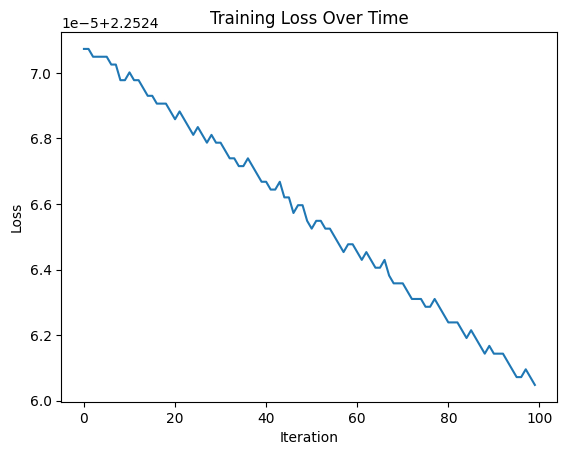

In [800]:
# training the nueral network
losses = []
epochs = 100

for i in range(epochs):
    
    # forward pass
    xs1_enc = F.one_hot(xs1, num_classes=27).float()
    xs2_enc = F.one_hot(xs2, num_classes=27).float()
    xenc = torch.cat((xs1_enc, xs2_enc), dim=1) # input to neural network: 2-hot encoding
    logits = xenc @ W # prediction log counts
    counts = logits.exp() 
    probs = counts / counts.sum(dim=1, keepdims=True) # these 2 lines is applying softmax (activation function)
    loss = -probs[torch.arange(num), ys].log().mean() + 0.01*(W**2).mean()
    
    # backward pass
    W.grad = None
    loss.backward()

    # update
    W.data += -10 * W.grad

    losses.append(loss.item())
    print(f"Epoch {i+1}/{epochs}, Loss: {loss.item()}")
    

plt.plot(losses)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.show()

In [799]:
g = torch.Generator().manual_seed(378291)

for _ in range(10):
    out = []
    ix1 = 0
    ix2 = 0
    while True:
        xs1_enc = F.one_hot(torch.tensor([ix1]), num_classes=27).float()
        xs2_enc = F.one_hot(torch.tensor([ix2]), num_classes=27).float()
        xenc = torch.cat((xs1_enc, xs2_enc), dim=1)
        logits = xenc @ W
        counts = logits.exp()
        p = counts / counts.sum(dim=1, keepdims=True)
        
        ix3 = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix3])
        ix1 = ix2
        ix2 = ix3
        if ix3 == 0:
            break
    print(''.join(out))

oasalitorex.
sin.
ianodinanaan.
niellan.
xanel.
zacylatharian.
aymia.
amrith.
adren.
avyanttilleothroutlyveeven.


In [ ]:
# Counting model names
dashlotorri.
sin.
ivio.
inon.
anny.
quezmer.
kel.
zacyjatharian.
tymil.
goritt.

In [844]:
# E02
import random

In [845]:
random.shuffle(words)

train_size = int(0.8*len(words))
dev_size = int(0.1*len(words))

train_set = words[:train_size]
dev_set = words[train_size:train_size+dev_size]
test_set = words[train_size+dev_size:]

In [846]:
chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i, s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s, i in stoi.items()}

In [847]:
# bigram counting model
N = torch.zeros((27, 27), dtype=torch.int32)

In [848]:
for w in train_set:
    chrs = ['.'] + list(w) + ['.']
    for chr1, chr2 in zip(chrs, chrs[1:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        N[ix1, ix2] += 1

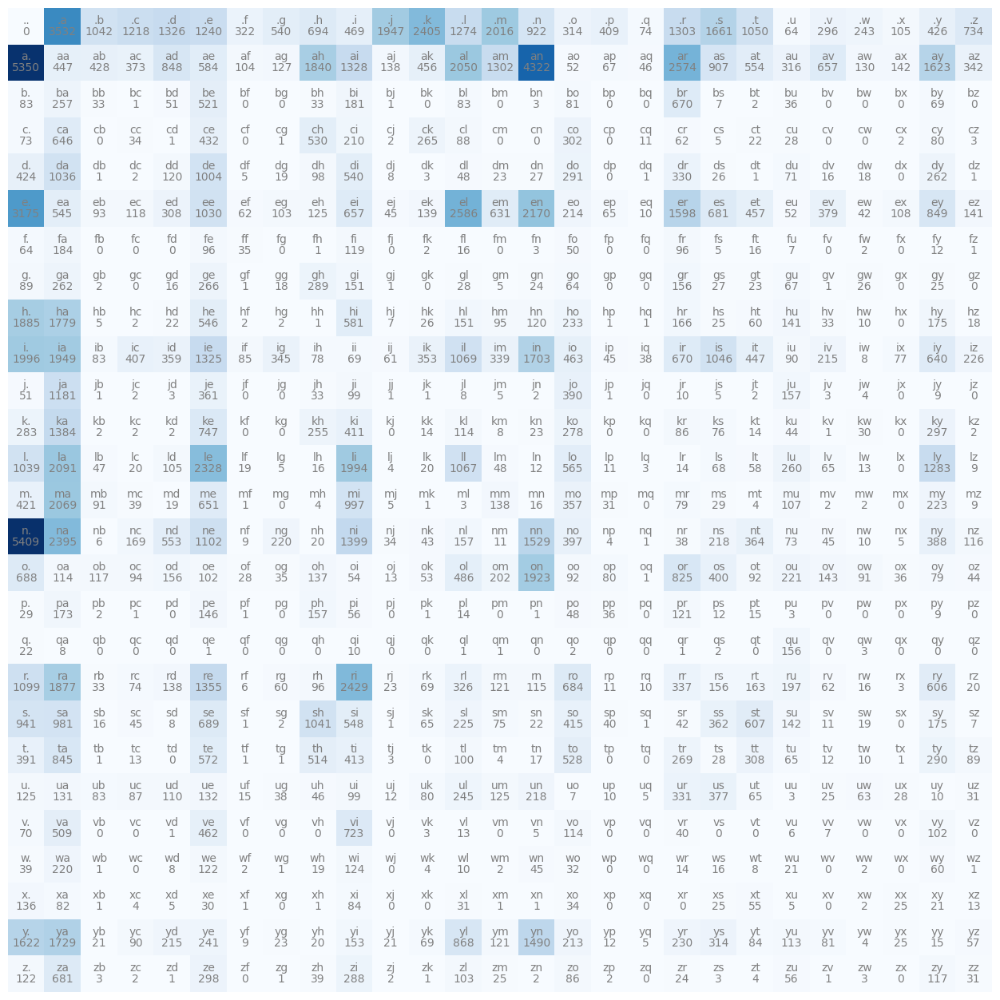

In [849]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(16, 16))
plt.imshow(N, cmap='Blues')
for i in range(27):
    for j in range(27):
        chrstr = itos[i] + itos[j]
        plt.text(j, i, chrstr, ha="center", va="bottom", color='Gray')
        plt.text(j, i, N[i, j].item(), ha="center", va="top", color='Gray')
plt.axis('off');

In [850]:
P = (N+1).float()
P /= P.sum(1, keepdim=True)

In [853]:
g = torch.Generator().manual_seed(2147483647)

for _ in range(10):
    out = []
    idx = 0
    while True:
        p = P[idx]
        idx = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[idx])
        if idx == 0:
            break
    print(''.join(out))

cexze.
momasurailezitynn.
konimittain.
llayn.
ka.
da.
staiyaubrtthrigotai.
moliellavo.
ke.
teda.


In [861]:
def evaluate_bigram_loss(data_set, P):
    log_likelihood = 0.0
    n = 0

    for w in data_set:
        chrs = ['.'] + list(w) + ['.']
        for chr1, chr2 in zip(chrs, chrs[1:]):
            ix1 = stoi[chr1]
            ix2 = stoi[chr2]
            prob = P[ix1, ix2]
            logprob = torch.log(prob)
            log_likelihood += logprob
            n += 1

    nll = -log_likelihood
    avg_nll = nll / n
    return avg_nll, nll
    
avg_nll, nll = evaluate_bigram_loss(train_set, P)
print("bigram counting model training loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_bigram_loss(dev_set, P)
print("\n\nbigram counting model dev loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_bigram_loss(test_set, P)
print("\n\nbigram counting model test loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

bigram counting model training loss
nll=tensor(447911.5938)
2.454498291015625


bigram counting model dev loss
nll=tensor(56110.9570)
2.454225540161133


bigram counting model test loss
nll=tensor(56027.6055)
2.457674503326416


In [862]:
# bigram neural network

# create the dataset
xs, ys = [], []
for w in train_set:
  chs = ['.'] + list(w) + ['.']
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    xs.append(ix1)
    ys.append(ix2)
xs = torch.tensor(xs)
ys = torch.tensor(ys)
num = xs.nelement()
print('number of examples: ', num)

# initialize the 'network'
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g, requires_grad=True)

number of examples:  182486


In [913]:
# gradient descent
for _ in range(10):
  
  # forward pass
  xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoding
  logits = xenc @ W # predict log-counts
  counts = logits.exp() # counts, equivalent to N
  probs = counts / counts.sum(1, keepdims=True) # probabilities for next character
  loss = -probs[torch.arange(num), ys].log().mean() + 0.01*(W**2).mean()
  
  # backward pass
  W.grad = None # set to zero the gradient
  loss.backward()
  
  # update
  W.data += -50 * W.grad

print(loss.item())

2.4805047512054443


In [916]:
g = torch.Generator().manual_seed(2147483647)

for _ in range(10):
    out = []
    idx = 0
    while True:
        xenc = F.one_hot(torch.tensor([idx]), num_classes=27).float()
        logits = xenc @ W
        counts = logits.exp()
        p = counts / counts.sum(dim=1, keepdims=True)
        
        idx = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[idx])
        if idx == 0:
            break
    print(''.join(out))

cexze.
momasurailezityha.
konimittain.
llayn.
ka.
da.
staiyaubrtthrigotai.
moliellavo.
ke.
teda.


In [922]:
def evaluate_bigram_nn_loss(data_set, W):
    log_likelihood = 0.0
    n = 0

    for w in data_set:
        chrs = ['.'] + list(w) + ['.']
        for chr1, chr2 in zip(chrs, chrs[1:]):
            ix1 = stoi[chr1]
            ix2 = stoi[chr2]

            xenc = F.one_hot(torch.tensor([ix1]), num_classes=27).float()
            logits = xenc @ W
            counts = logits.exp()
            probs = counts / counts.sum(dim=1, keepdims=True)
            
            prob = probs[0, ix2]
            logprob = torch.log(prob)
            log_likelihood += logprob
            n += 1

    nll = -log_likelihood
    avg_nll = nll / n
    return avg_nll, nll
    
avg_nll, nll = evaluate_bigram_nn_loss(train_set, W)
print("bigram neural net model training loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_bigram_nn_loss(dev_set, W)
print("\n\nbigram neural net model dev loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_bigram_nn_loss(test_set, W)
print("\n\nbigram neural net model test loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

bigram neural net model training loss
nll=tensor(449046.6875, grad_fn=<NegBackward0>)
2.4607186317443848


bigram neural net model dev loss
nll=tensor(56216.6875, grad_fn=<NegBackward0>)
2.4588499069213867


bigram neural net model test loss
nll=tensor(56151.7539, grad_fn=<NegBackward0>)
2.463120222091675


In [931]:
# trigram counting model
N = torch.zeros((27, 27, 27), dtype=torch.int32)

In [932]:
for w in train_set:
    chrs = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chrs, chrs[1:], chrs[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        N[ix1, ix2, ix3] += 1

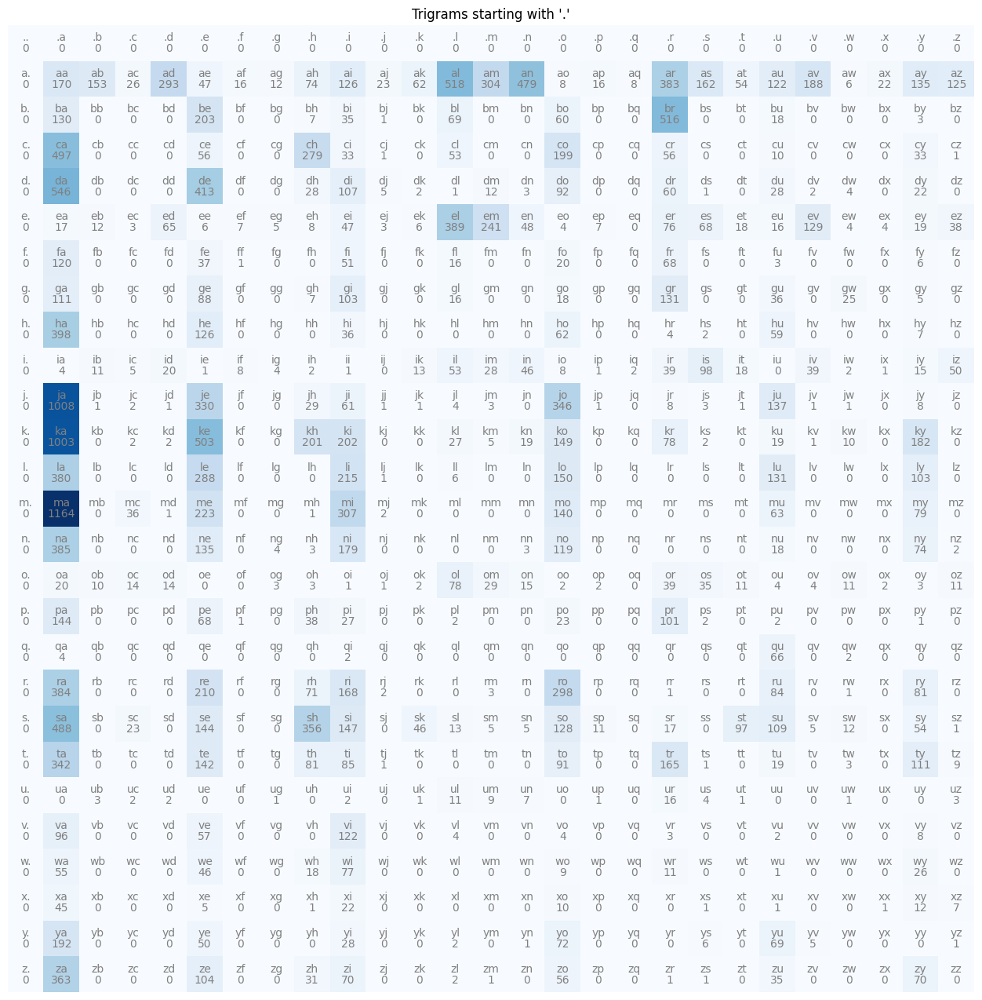

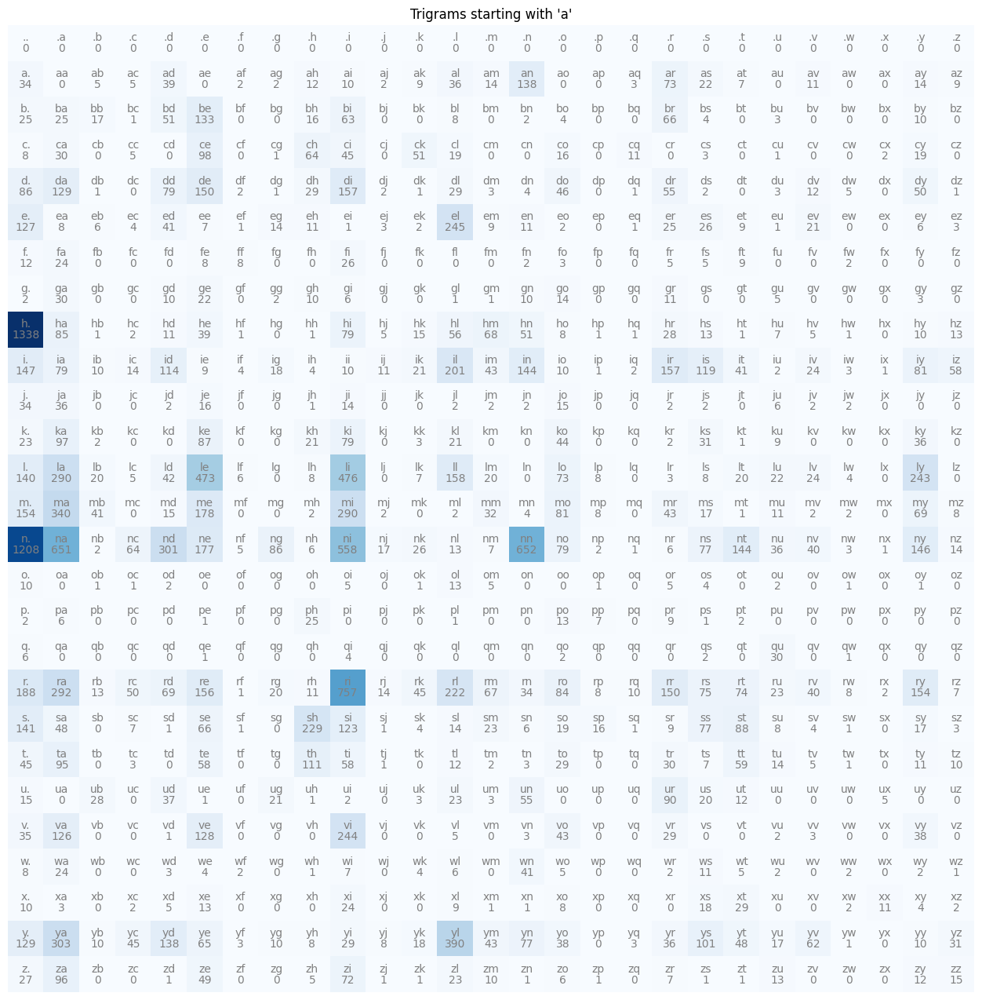

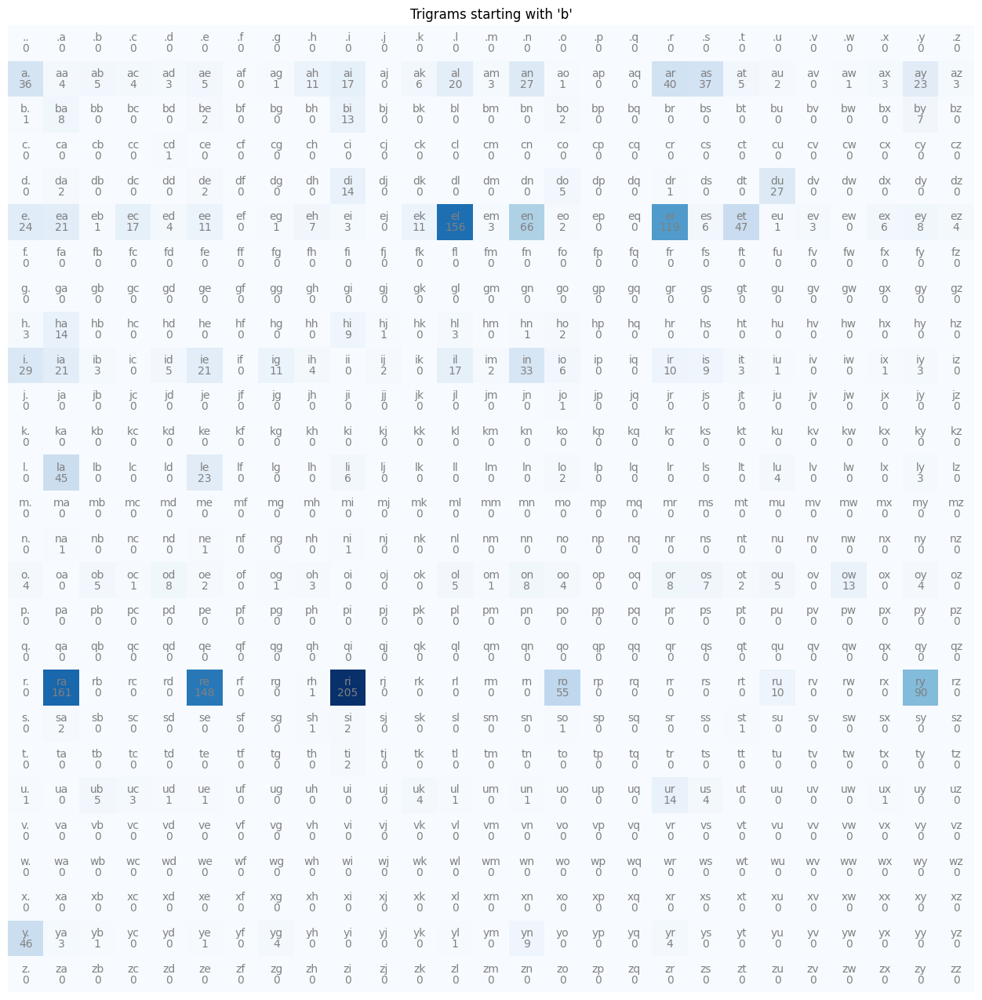

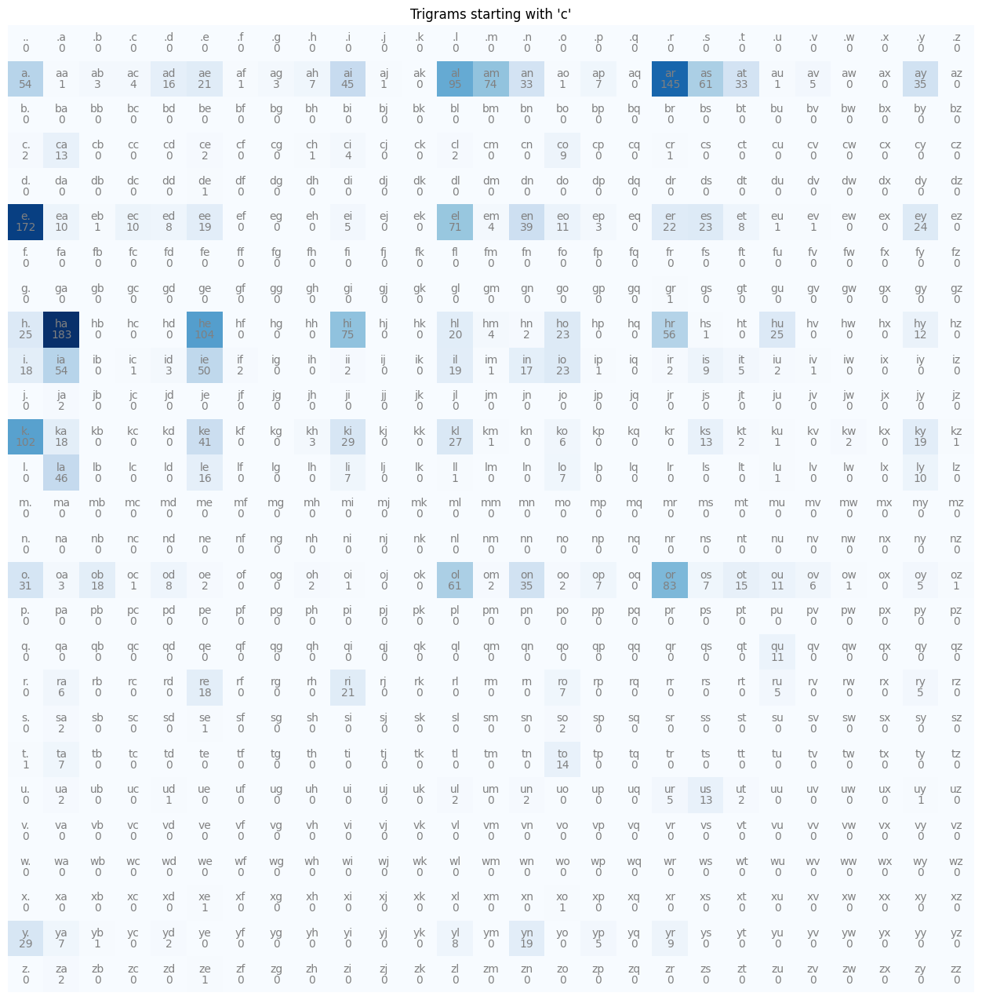

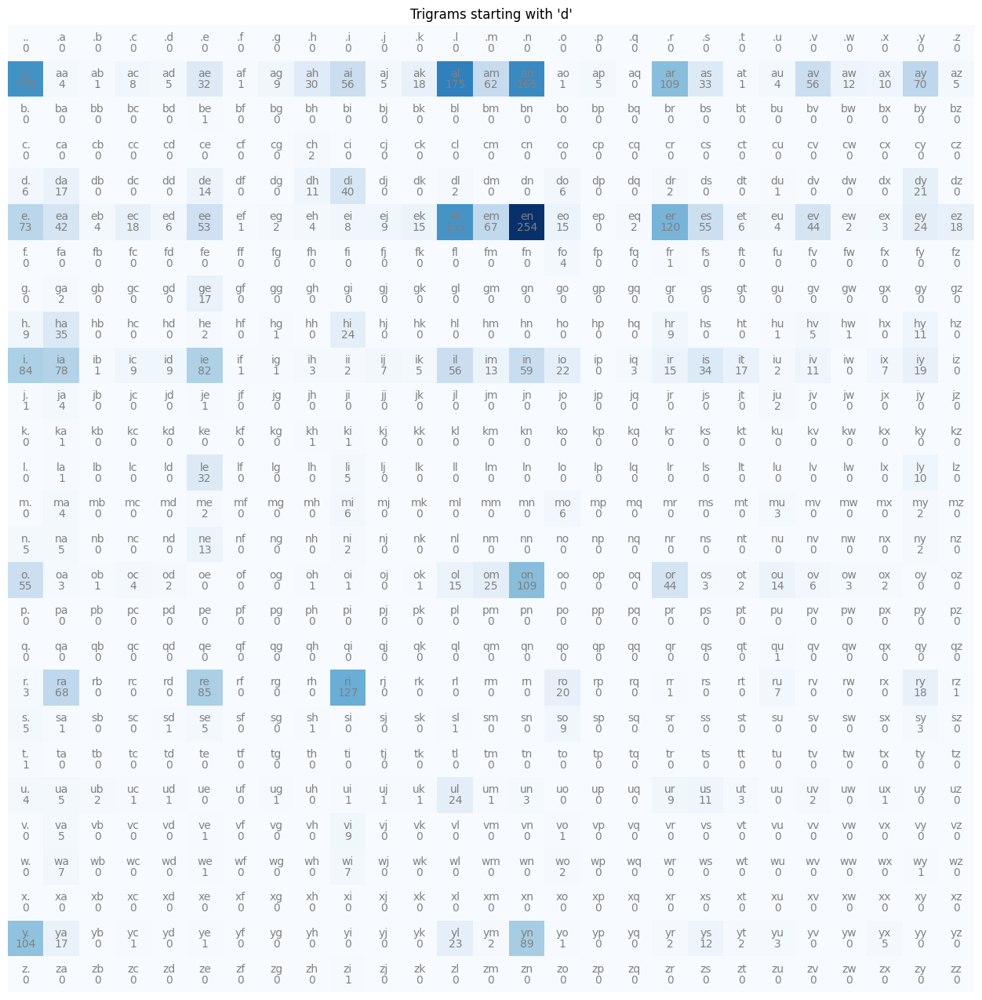

...

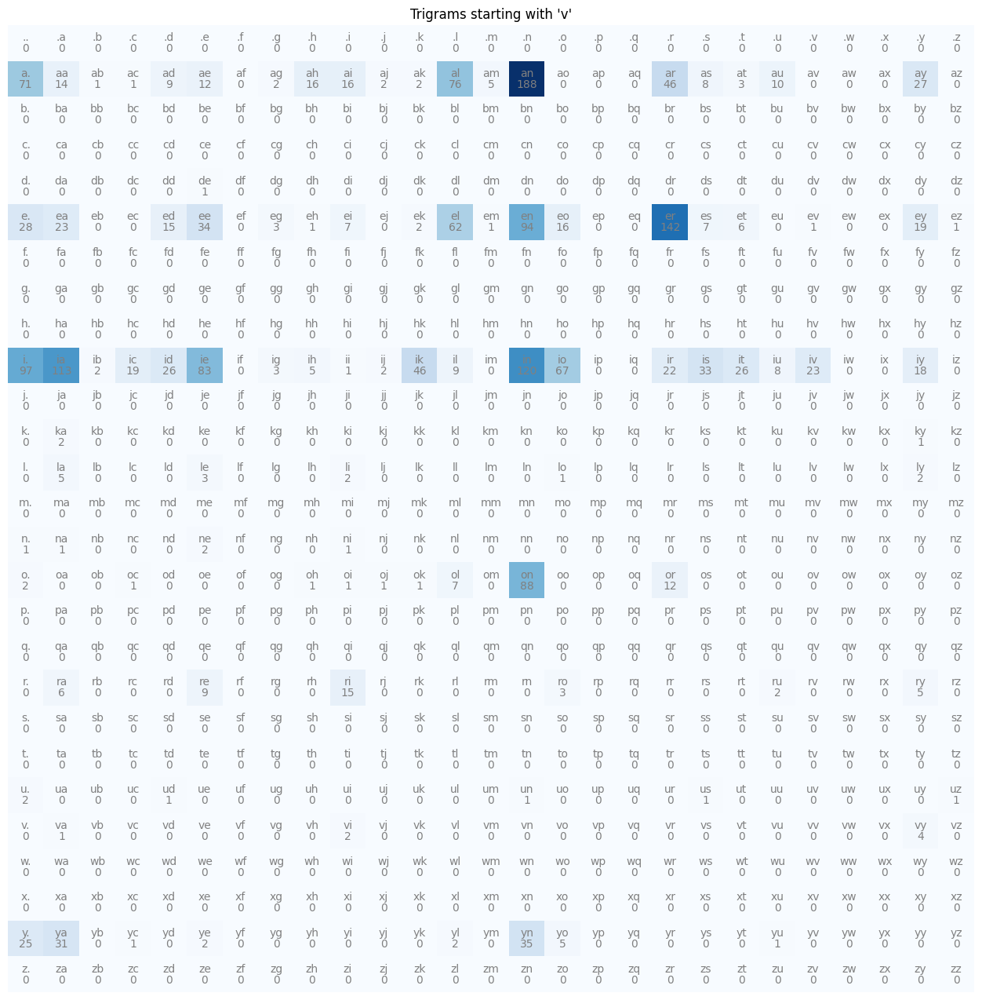

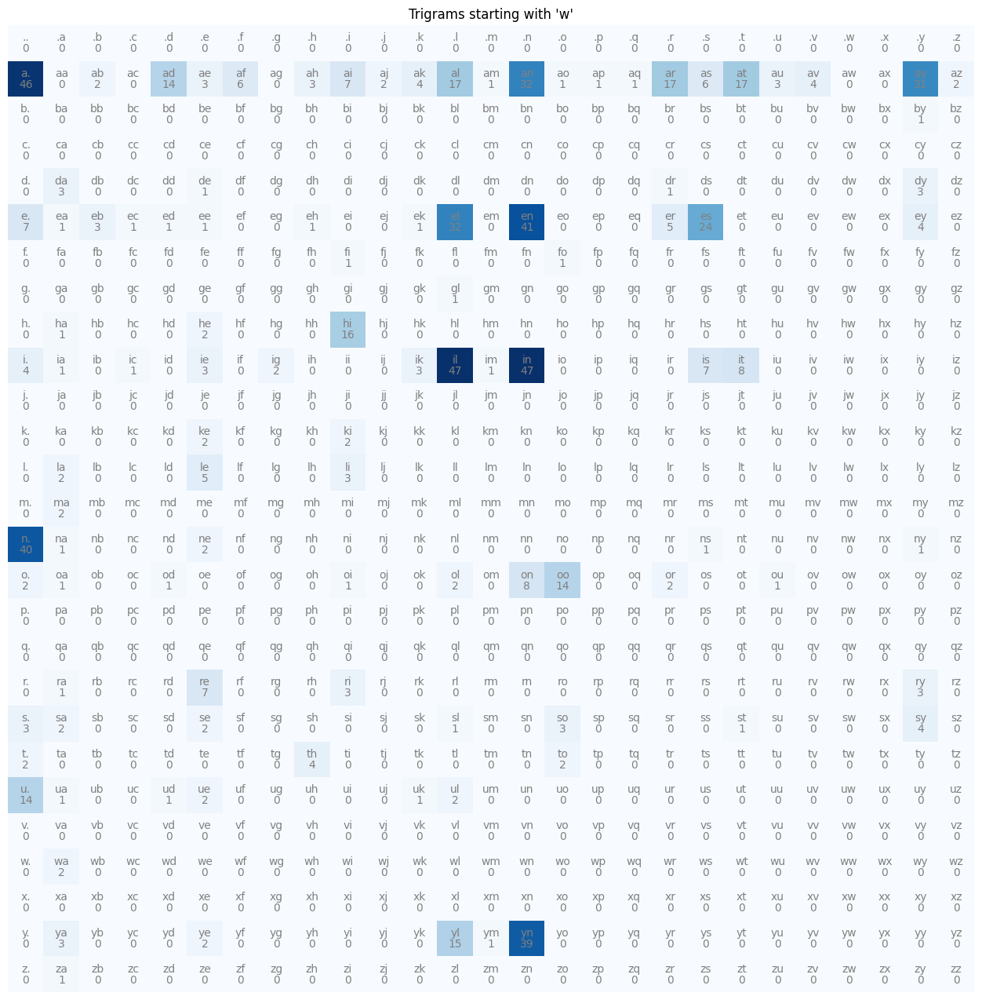

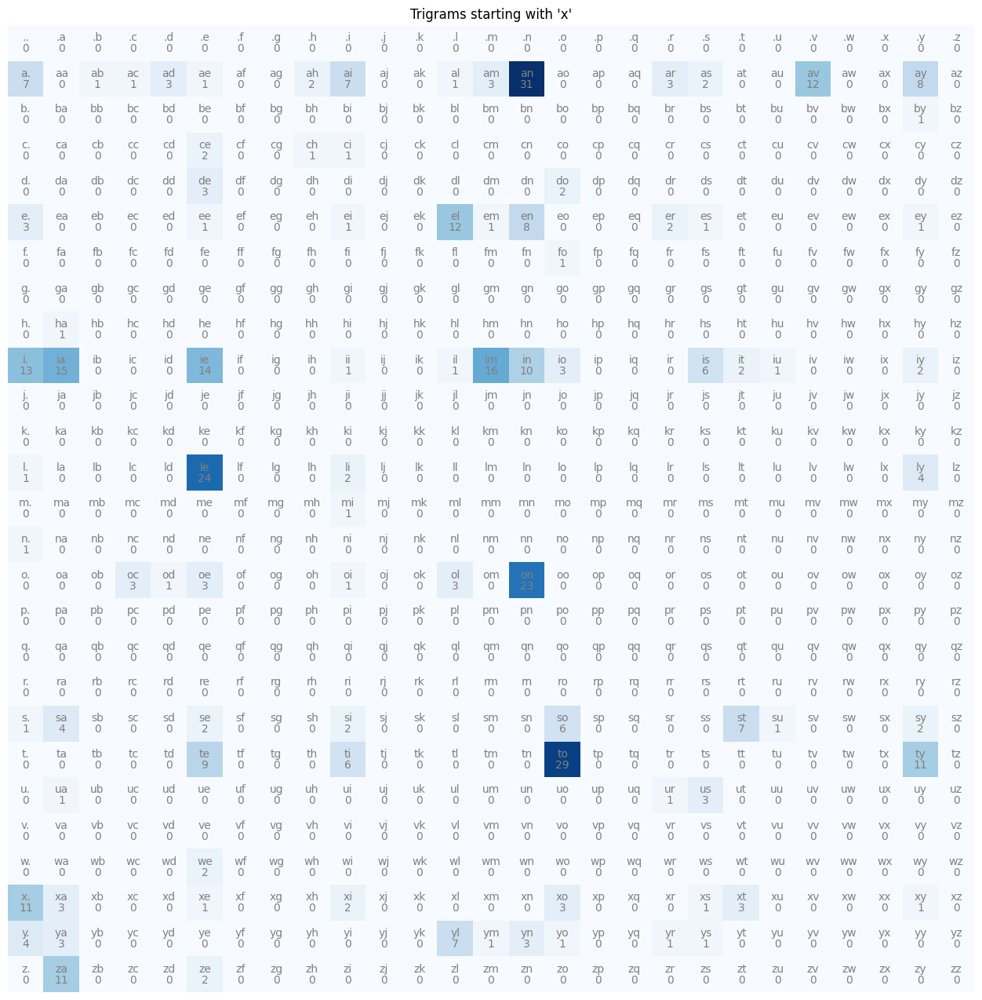

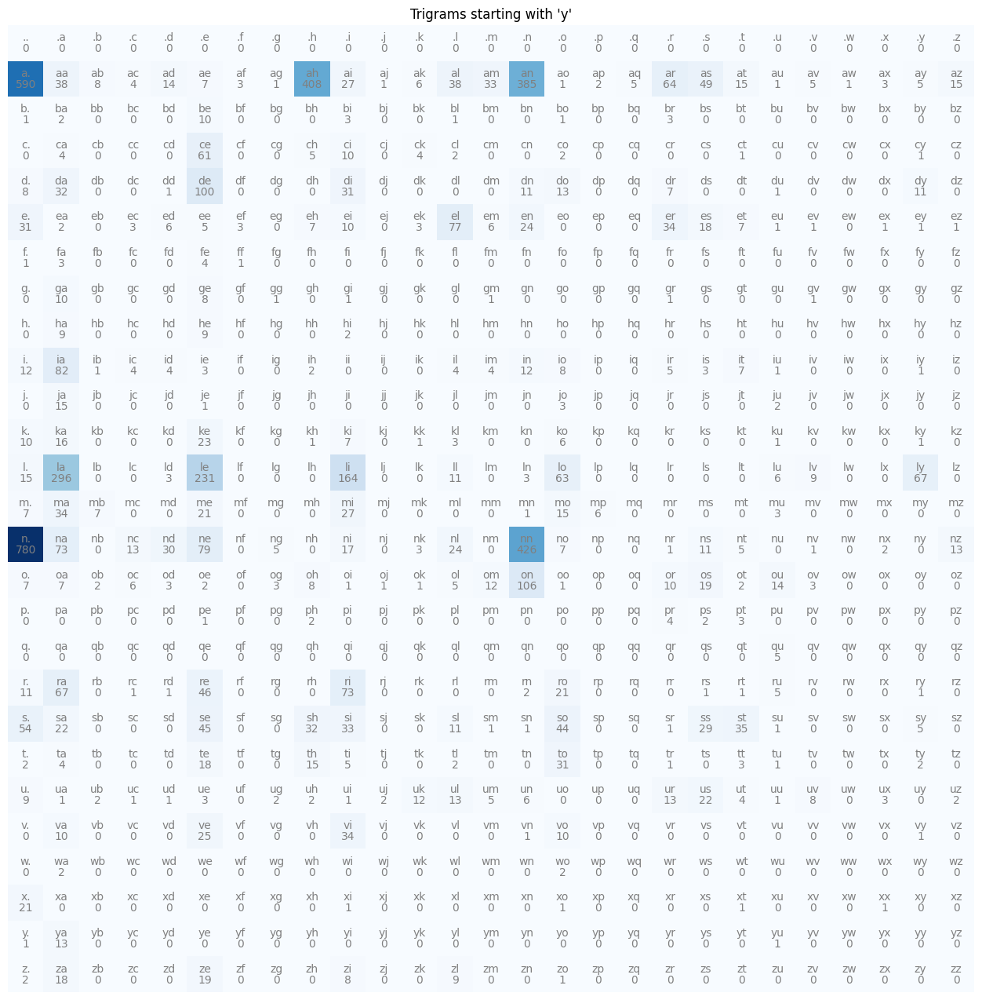

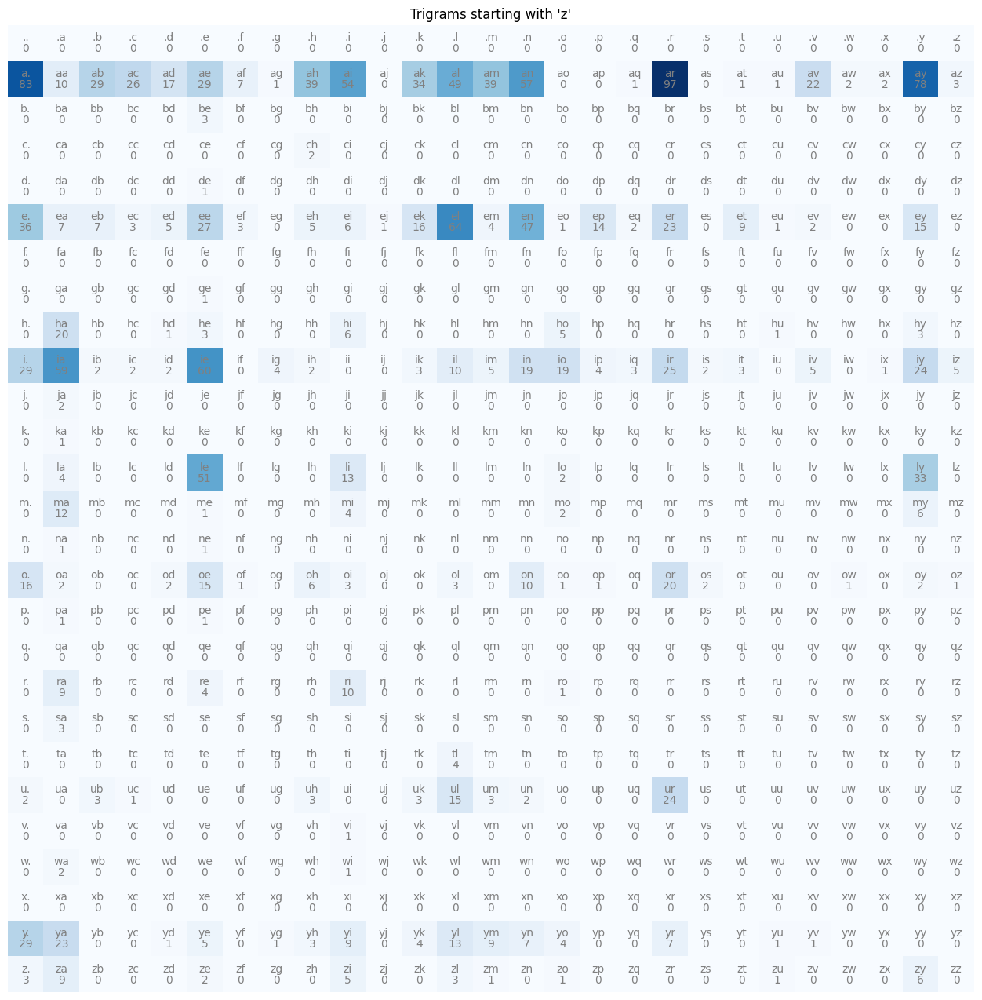

In [933]:
for slice_ix in range(27):  # Iterate over all possible starting characters
    slice_data = N[slice_ix]  # Extract the 27x27 slice for the character

    plt.figure(figsize=(16, 16))
    plt.imshow(slice_data, cmap='Blues')
    for i in range(27):
        for j in range(27):
            chrstr = itos[i] + itos[j]
            plt.text(j, i, chrstr, ha="center", va="bottom", color='Gray')
            plt.text(j, i, slice_data[i, j].item(), ha="center", va="top", color='Gray')
    plt.title(f"Trigrams starting with '{itos[slice_ix]}'")
    plt.axis('off')
    plt.show()

In [934]:
P = (N + 1).float()
P /= P.sum(dim=2, keepdims=True)

In [935]:
g = torch.Generator().manual_seed(378291)

for _ in range(10):
    out = []
    ix1 = 0
    ix2 = 0
    while True:
        p = P[ix1, ix2]
        ix3 = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix3])
        ix1 = ix2
        ix2 = ix3
        if ix3 == 0:
            break
    print(''.join(out))

dashlotorri.
sin.
iviodi.
jaka.
ry.
quezmvxmkvlfzvcyjatharian.
tymil.
goritt.
nysen.
jeyantallexotaro.


In [936]:
def evaluate_trigram_loss(data_set, P):
    log_likelihood = 0.0
    n = 0

    for w in data_set:
        chrs = ['.'] + list(w) + ['.']
        for chr1, chr2, chr3 in zip(chrs, chrs[1:], chrs[2:]):
            ix1 = stoi[chr1]
            ix2 = stoi[chr2]
            ix3 = stoi[chr3]
            prob = P[ix1, ix2, ix3]
            logprob = torch.log(prob)
            log_likelihood += logprob
            n += 1

    nll = -log_likelihood
    avg_nll = nll / n
    return avg_nll, nll
    
avg_nll, nll = evaluate_trigram_loss(train_set, P)
print("trigram counting model training loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_trigram_loss(dev_set, P)
print("\n\ntrigram counting model dev loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_trigram_loss(test_set, P)
print("\n\ntrigram counting model test loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

trigram counting model training loss
nll=tensor(328971.2500)
2.097228527069092


trigram counting model dev loss
nll=tensor(41641.2344)
2.1180689334869385


trigram counting model test loss
nll=tensor(41547.3555)
2.1205203533172607


In [937]:
# trigram neural network

# creating dataset set for trigrams
xs1 = []
xs2 = []
ys = []

for w in train_set:
    chars = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chars, chars[1:], chars[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        xs1.append(ix1)
        xs2.append(ix2)
        ys.append(ix3)

xs1 = torch.tensor(xs1)
xs2 = torch.tensor(xs2)
ys = torch.tensor(ys)
num = xs1.nelement()
print('number of examples: ', num)

# initialize the 'network'
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((54, 27), generator=g, requires_grad=True)

number of examples:  156860


In [998]:
# training the nueral network

for _ in range(100):
    
    # forward pass
    xs1_enc = F.one_hot(xs1, num_classes=27).float()
    xs2_enc = F.one_hot(xs2, num_classes=27).float()
    xenc = torch.cat((xs1_enc, xs2_enc), dim=1) # input to neural network: 2-hot encoding
    logits = xenc @ W # prediction log counts
    counts = logits.exp() 
    probs = counts / counts.sum(dim=1, keepdims=True) # these 2 lines is applying softmax (activation function)
    loss = -probs[torch.arange(num), ys].log().mean() + 0.01*(W**2).mean()
    
    # backward pass
    W.grad = None
    loss.backward()

    # update
    W.data += -10 * W.grad

print(loss.item())

2.252955436706543


In [1008]:
g = torch.Generator().manual_seed(378291)

for _ in range(10):
    out = []
    ix1 = 0
    ix2 = 0
    while True:
        xs1_enc = F.one_hot(torch.tensor([ix1]), num_classes=27).float()
        xs2_enc = F.one_hot(torch.tensor([ix2]), num_classes=27).float()
        xenc = torch.cat((xs1_enc, xs2_enc), dim=1)
        logits = xenc @ W
        counts = logits.exp()
        p = counts / counts.sum(dim=1, keepdims=True)
        
        ix3 = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix3])
        ix1 = ix2
        ix2 = ix3
        if ix3 == 0:
            break
    print(''.join(out))

uasalitorex.
sin.
ianodinanaan.
yan.
oam.
xanel.
zacylatharian.
aymia.
amrith.
adren.


In [1009]:
def evaluate_trigram_nn_loss(data_set, W):
    log_likelihood = 0.0
    n = 0

    for w in data_set:
        chrs = ['.'] + list(w) + ['.']
        for chr1, chr2, chr3 in zip(chrs, chrs[1:], chrs[2:]):
            ix1 = stoi[chr1]
            ix2 = stoi[chr2]
            ix3 = stoi[chr3]

            xs1_enc = F.one_hot(torch.tensor([ix1]), num_classes=27).float()
            xs2_enc = F.one_hot(torch.tensor([ix2]), num_classes=27).float()
            xenc = torch.cat((xs1_enc, xs2_enc), dim=1)
            logits = xenc @ W
            counts = logits.exp()
            probs = counts / counts.sum(dim=1, keepdims=True)
            
            prob = probs[0, ix3]
            logprob = torch.log(prob)
            log_likelihood += logprob
            n += 1

    nll = -log_likelihood
    avg_nll = nll / n
    return avg_nll, nll
    
avg_nll, nll = evaluate_trigram_nn_loss(train_set, W)
print("trigram neural net model training loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_trigram_nn_loss(dev_set, W)
print("\n\ntrigram neural net model dev loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

avg_nll, nll = evaluate_trigram_nn_loss(test_set, W)
print("\n\ntrigram neural net model test loss")
print(f'{nll=}')
print(f'{avg_nll.item()}')

trigram neural net model training loss
nll=tensor(351502., grad_fn=<NegBackward0>)
2.2408645153045654


trigram neural net model dev loss
nll=tensor(44016.2773, grad_fn=<NegBackward0>)
2.238874673843384


trigram neural net model test loss
nll=tensor(43921.7227, grad_fn=<NegBackward0>)
2.2417049407958984


In [1013]:
# E03

In [1014]:
# using dev set loss to find the best k (smoothing constant/laplace smoothing parameter) and 
# then evaluate once on the test loss

In [1049]:
# trigram counting model
N = torch.zeros((27, 27, 27), dtype=torch.int32)

In [1050]:
for w in train_set:
    chrs = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chrs, chrs[1:], chrs[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        N[ix1, ix2, ix3] += 1

In [1051]:
k = [0.1, 1, 5, 10, 20]
P_list = []
for i in range(len(k)):
    K = k[i]
    P = (N + K).float()/(N + K).float().sum(dim=2, keepdims=True)
    P_list.append(P)

In [1053]:
loss_idx = 0
loss_val = float('inf')

for i, P in enumerate(P_list):
    print(f'\n\nDev set loss for k = {k[i]}')
    avg_nll, nll = evaluate_trigram_loss(data_set=dev_set, P=P)
    print(f'{nll=}')
    print(f'{avg_nll.item()}')

    if avg_nll.item() < loss_val:
        loss_val = avg_nll.item()
        loss_idx = i

print("\n\n<-------Results---------->")
print(f"Lowest loss when evaluated on dev set was for \nk = {k[loss_idx]}\nLoss = {loss_val}")



Dev set loss for k = 0.1
nll=tensor(41350.7188)
2.1032919883728027


Dev set loss for k = 1
nll=tensor(41641.2344)
2.1180689334869385


Dev set loss for k = 5
nll=tensor(43154.0781)
2.195019245147705


Dev set loss for k = 10
nll=tensor(44540.3125)
2.2655296325683594


Dev set loss for k = 20
nll=tensor(46534.8281)
2.3669800758361816


<-------Results---------->
Lowest loss when evaluated on dev set was for 
k = 0.1
Loss = 2.1032919883728027


In [1056]:
print(f"Evaluating loss on the train set with k = {k[loss_idx]}")
avg_nll, nll = evaluate_trigram_loss(data_set=train_set, P=P_list[loss_idx])
print(f"{nll=}")
print(f"{avg_nll.item()}")

Evaluating loss on the train set with k = 0.1
nll=tensor(323837.4062)
2.064499616622925


In [1055]:
print(f"Evaluating loss on the test set with k = {k[loss_idx]}")
avg_nll, nll = evaluate_trigram_loss(data_set=test_set, P=P_list[loss_idx])
print(f"{nll=}")
print(f"{avg_nll.item()}")

Evaluating loss on the test set with k = 0.1
nll=tensor(41228.5938)
2.1042511463165283


In [1057]:
g = torch.Generator().manual_seed(378291)

for _ in range(10):
    out = []
    ix1 = 0
    ix2 = 0
    while True:
        p = P_list[loss_idx][ix1, ix2]
        ix3 = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix3])
        ix1 = ix2
        ix2 = ix3
        if ix3 == 0:
            break
    print(''.join(out))

dashlotorri.
sin.
ivio.
inon.
anny.
quellextond.
zacy.
ra.
lorbe.
tymil.


In [ ]:
dashlotorri.
sin.
iviodi.
jaka.
ry.
quezmvxmkvlfzvcyjatharian.
tymil.
goritt.
nysen.
jeyantallexotaro.

In [1191]:
# trigram neural network

# creating dataset set for trigrams
xs1 = []
xs2 = []
ys = []

for w in train_set:
    chars = ['.'] + list(w) + ['.']
    for chr1, chr2, chr3 in zip(chars, chars[1:], chars[2:]):
        ix1 = stoi[chr1]
        ix2 = stoi[chr2]
        ix3 = stoi[chr3]
        xs1.append(ix1)
        xs2.append(ix2)
        ys.append(ix3)

xs1 = torch.tensor(xs1)
xs2 = torch.tensor(xs2)
ys = torch.tensor(ys)
num = xs1.nelement()
print('number of examples: ', num)

number of examples:  156860


In [1192]:
# training the nueral network
g = torch.Generator().manual_seed(2147483647)

reg_coeffs = [0.0001, 0.001, 0.01, 0.1, 1, 10]
W_list = []

epochs = 500
lr = 50

for reg_coeff in reg_coeffs:
    # initialize the network
    W = torch.randn((54, 27), generator=g, requires_grad=True)
    for i in range(epochs):
        # forward pass
        xs1_enc = F.one_hot(xs1, num_classes=27).float()
        xs2_enc = F.one_hot(xs2, num_classes=27).float()
        xenc = torch.cat((xs1_enc, xs2_enc), dim=1) # input to neural network: 2-hot encoding
        logits = xenc @ W # prediction log counts
        counts = logits.exp() 
        probs = counts / counts.sum(dim=1, keepdims=True) # these 2 lines is applying softmax (activation function)
        loss = -probs[torch.arange(num), ys].log().mean() + reg_coeff*(W**2).mean()
        
        # backward pass
        W.grad = None
        loss.backward()
    
        # update
        W.data += -lr * W.grad
    W_list.append(W)
    print(f'Training loss for lambda = {reg_coeff} is {loss.item()}')

Training loss for lambda = 0.0001 is 2.2411162853240967
Training loss for lambda = 0.001 is 2.242496967315674
Training loss for lambda = 0.01 is 2.2541379928588867
Training loss for lambda = 0.1 is 2.3195137977600098
Training loss for lambda = 1 is 2.545773983001709
Training loss for lambda = 10 is 2.9876742362976074


In [1193]:
loss_idx = 0
loss_val = float('inf')

for i, W in enumerate(W_list):
    print(f'\n\nDev set loss for lambda = {reg_coeffs[i]}')
    avg_nll, nll = evaluate_trigram_nn_loss(data_set=dev_set, W=W)
    print(f'{nll=}')
    print(f'{avg_nll.item()}')

    if avg_nll.item() < loss_val:
        loss_val = avg_nll.item()
        loss_idx = i

print("\n\n<-------Results---------->")
print(f"Lowest loss when evaluated on dev set was for \nlambda = {reg_coeffs[loss_idx]}\nLoss = {loss_val}")



Dev set loss for lambda = 0.0001
nll=tensor(44017.0977, grad_fn=<NegBackward0>)
2.2389163970947266


Dev set loss for lambda = 0.001
nll=tensor(44025.1875, grad_fn=<NegBackward0>)
2.239327907562256


Dev set loss for lambda = 0.01
nll=tensor(44051.4180, grad_fn=<NegBackward0>)
2.240662097930908


Dev set loss for lambda = 0.1
nll=tensor(44471.0195, grad_fn=<NegBackward0>)
2.262005090713501


Dev set loss for lambda = 1
nll=tensor(46996.2227, grad_fn=<NegBackward0>)
2.390448808670044


Dev set loss for lambda = 10
nll=tensor(55230.6680, grad_fn=<NegBackward0>)
2.809291362762451


<-------Results---------->
Lowest loss when evaluated on dev set was for 
lambda = 0.0001
Loss = 2.2389163970947266


In [1194]:
print(f"Evaluating loss on the train set with lambda = {reg_coeffs[loss_idx]}")
avg_nll, nll = evaluate_trigram_nn_loss(data_set=train_set, W=W_list[loss_idx])
print(f"{nll=}")
print(f"{avg_nll.item()}")

Evaluating loss on the train set with lambda = 0.0001
nll=tensor(351521.3438, grad_fn=<NegBackward0>)
2.240987777709961


In [1195]:
print(f"Evaluating loss on the test set with lambda = {reg_coeffs[loss_idx]}")
avg_nll, nll = evaluate_trigram_nn_loss(data_set=test_set, W=W_list[loss_idx])
print(f"{nll=}")
print(f"{avg_nll.item()}")

Evaluating loss on the test set with lambda = 0.0001
nll=tensor(43921.3633, grad_fn=<NegBackward0>)
2.2416865825653076


In [1241]:
g = torch.Generator().manual_seed(378291)

for _ in range(10):
    out = []
    ix1 = 0
    ix2 = 0
    while True:
        xs1_enc = F.one_hot(torch.tensor([ix1]), num_classes=27).float()
        xs2_enc = F.one_hot(torch.tensor([ix2]), num_classes=27).float()
        xenc = torch.cat((xs1_enc, xs2_enc), dim=1)
        logits = xenc @ W_list[loss_idx]
        counts = logits.exp()
        p = counts / counts.sum(dim=1, keepdims=True)
        
        ix3 = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(itos[ix3])
        ix1 = ix2
        ix2 = ix3
        if ix3 == 0:
            break
    print(''.join(out))

oasalitorex.
ain.
ianodinanaan.
niellan.
amiel.
zacylatharian.
aymia.
amrith.
adren.
avyanttilleothroutlyveeven.


In [ ]:
uasalitorex.
sin.
ianodinanaan.
yan.
oam.
xanel.
zacylatharian.
aymia.
amrith.
adren.

In [1242]:
# E04

In [1253]:
# create the dataset
xs, ys = [], []
for w in words:
  chs = ['.'] + list(w) + ['.']
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    xs.append(ix1)
    ys.append(ix2)
xs = torch.tensor(xs)
ys = torch.tensor(ys)
num = xs.nelement()
print('number of examples: ', num)

# initialize the 'network'
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g, requires_grad=True)

number of examples:  228146


In [1254]:
# gradient descent
for _ in range(1000):
  
  # forward pass
  logits = W[xs] # predict log-counts
  counts = logits.exp() # counts, equivalent to N
  probs = counts / counts.sum(1, keepdims=True) # probabilities for next character
  loss = -probs[torch.arange(num), ys].log().mean() + 0.01*(W**2).mean()
  # print(loss.item())
  
  # backward pass
  W.grad = None # set to zero the gradient
  loss.backward()
  
  # update
  W.data += -50 * W.grad

print(loss.item())

2.4804470539093018


In [1255]:
# finally, sample from the 'neural net' model
g = torch.Generator().manual_seed(2147483647)

for i in range(10):
  
  out = []
  ix = 0
  while True:
      
    logits = W[ix] # predict log-counts
    counts = logits.exp() # counts, equivalent to N
    p = counts / counts.sum() # probabilities for next character
    
    ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
    out.append(itos[ix])
    if ix == 0:
      break
  print(''.join(out))

cexze.
momasurailezityha.
konimittain.
llayn.
ka.
da.
staiyaubrtthrigotai.
moliellavo.
ke.
teda.


In [1358]:
# E05

In [1359]:
# create the dataset
xs, ys = [], []
for w in words:
  chs = ['.'] + list(w) + ['.']
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    xs.append(ix1)
    ys.append(ix2)
xs = torch.tensor(xs)
ys = torch.tensor(ys)
num = xs.nelement()
print('number of examples: ', num)

# initialize the 'network'
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g, requires_grad=True)

number of examples:  228146


In [1360]:
# gradient descent
for _ in range(1000):
  
  # forward pass
  logits = W[xs] # predict log-counts
  loss = F.cross_entropy(input=logits, target=ys) + 0.01*(W**2).mean()
  # print(loss.item())
  
  # backward pass
  W.grad = None # set to zero the gradient
  loss.backward()
  
  # update
  W.data += -50 * W.grad

print(loss.item())

2.4804470539093018


In [1361]:
# finally, sample from the 'neural net' model
g = torch.Generator().manual_seed(2147483647)

for i in range(10):
  
  out = []
  ix = 0
  while True:
      
    logits = W[ix] # predict log-counts
    counts = logits.exp() # counts, equivalent to N
    p = counts / counts.sum() # probabilities for next character
    
    ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
    out.append(itos[ix])
    if ix == 0:
      break
  print(''.join(out))

cexze.
momasurailezityha.
konimittain.
llayn.
ka.
da.
staiyaubrtthrigotai.
moliellavo.
ke.
teda.
